In [1]:
import numpy as np
import pandas as pd
from glob import glob
from tqdm import tqdm
import os
import copy
import json

import cv2
import matplotlib.pyplot as plt
from PIL import Image

In [10]:
for folder in os.listdir('/mnt/md0/dacl10k/images/'):
    files = sorted(glob(f'/mnt/md0/dacl10k/images/{folder}/*.jpg'))
    
    for file in tqdm(files):
        image = cv2.imread(file)
        save_file = file.replace('.jpg', '.npy')
        np.save(save_file, image)
        
        annot_file = file.replace('/images/', '/annotations/')
        if os.path.exists(annot_file):
            annot = json.load(open(annot_file))
    
    break

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1012/1012 [00:35<00:00, 28.82it/s]


In [42]:
for folder in os.listdir('/mnt/md0/dacl10k/images/')[1:]:
    files = sorted(glob(f'/mnt/md0/dacl10k/images/{folder}/*.jpg'))
    
    for file in tqdm(files):
        image = cv2.imread(file)
        save_file = file.replace('.jpg', '.npy')
        np.save(save_file, image)
        
        annot_file = file.replace('/images/', '/annotations/').replace('.jpg', '.json')
        if os.path.exists(annot_file):
            annot = json.load(open(annot_file))
            
            mask = annot_to_mask(annot)
            
        
        np.save(annot_file.replace('.json', '.npy'), mask)
            
        #break
    #break

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6935/6935 [16:38<00:00,  6.94it/s]


In [2]:
classes = {
    'Crack': 0,
    'Wetspot': 1,
    'ExposedRebars': 2,
    'ACrack': 3,
    'Rust': 4,
    'Bearing': 5,
    'Efflorescence': 6,
    'Graffiti': 7,
    'EJoint': 8,
    'Rockpocket': 9,
    'Weathering': 10,
    'Drainage': 11,
    'WConccor': 12,
    'PEquipment': 13,
    'Hollowareas': 14,
    'JTape': 15,
    'Cavity': 16,
    'Spalling': 17,
    'Restformwork': 18
}

def annot_to_mask(data):
    height, width = data['imageHeight'], data['imageWidth']
    masks = np.zeros((height, width, 19), dtype=np.uint8)

    # For each shape in the JSON data, draw a filled polygon on the corresponding mask
    for shape in data['shapes']:
        label = shape['label']
        points = np.array(shape['points'], np.int32)
        points = points.reshape((-1, 1, 2))
        masks[:, :, classes[label]] = cv2.fillPoly(masks[:, :, classes[label]].copy(), [points], 1)
    
    return masks

def process(i):
    file = files[i]
    
    image = cv2.imread(file)[:, :, ::-1]
        
    image = cv2.resize(image, (512, 512))

    save_file = file.replace('.jpg', '.npy')
    np.save(save_file, image)

    annot_file = file.replace('/images/', '/annotations/').replace('.jpg', '.json')
    if os.path.exists(annot_file):
        annot = json.load(open(annot_file))

        mask = annot_to_mask(annot)
        
        mask = cv2.resize(mask, (512, 512))


    np.save(annot_file.replace('.json', '.npy'), mask)

In [60]:
for folder in os.listdir('/mnt/md0/dacl10k/images/')[1:]:
    files = sorted(glob(f'/mnt/md0/dacl10k/images/{folder}/*.jpg'))
    
    import multiprocessing as mp
    start = 0
    with mp.Pool(processes=8) as pool:
        idxs = list(range(start, len(files)))
        imap = pool.imap(process, idxs)
        _ = list(tqdm(imap, total=len(files)-start))
            
        #break
    #break

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6935/6935 [03:56<00:00, 29.28it/s]


In [35]:
annot = json.load(open('/mnt/md0/dacl10k/annotations/validation/dacl10k_v2_validation_0034.json'))
mask = annot_to_mask(annot)

In [40]:
classes

{'Crack': 0,
 'Wetspot': 1,
 'ExposedRebars': 2,
 'ACrack': 3,
 'Rust': 4,
 'Bearing': 5,
 'Efflorescence': 6,
 'Graffiti': 7,
 'EJoint': 8,
 'Rockpocket': 9,
 'Weathering': 10,
 'Drainage': 11,
 'WConccor': 12,
 'PEquipment': 13,
 'Hollowareas': 14,
 'JTape': 15,
 'Cavity': 16,
 'Spalling': 17,
 'Restformwork': 18}

In [57]:
shs = {'shapes': [sh for sh in annot['shapes'] if sh['label']=='Rust']}
shs['imageHeight'] = annot['imageHeight']
shs['imageWidth'] = annot['imageWidth']
shs

{'shapes': [{'label': 'Rust',
   'points': [[533.8461538461538, 489.2307692307692],
    [570.0, 436.9230769230769],
    [613.8461538461538, 427.6923076923077],
    [640.7692307692307, 437.6923076923077],
    [650.0, 416.15384615384613],
    [578.4615384615385, 416.9230769230769],
    [520.0, 453.07692307692304],
    [513.0769230769231, 486.9230769230769]],
   'shape_type': 'polygon'},
  {'label': 'Rust',
   'points': [[596.6850828729282, 628.1767955801105],
    [500.55248618784526, 637.5690607734806],
    [675.6906077348066, 586.7403314917127],
    [662.3076923076923, 540.0],
    [683.8461538461538, 455.38461538461536],
    [750.7692307692307, 443.07692307692304],
    [837.6923076923076, 454.6153846153846],
    [856.9230769230769, 397.6923076923077],
    [943.8461538461538, 358.46153846153845],
    [1093.8461538461538, 377.6923076923077],
    [1166.1538461538462, 376.15384615384613],
    [1169.2307692307693, 416.9230769230769],
    [1212.3076923076924, 376.9230769230769],
    [1330.0, 

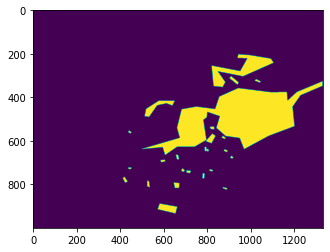

In [59]:
plt.imshow(annot_to_mask(shs)[:, :, 4])

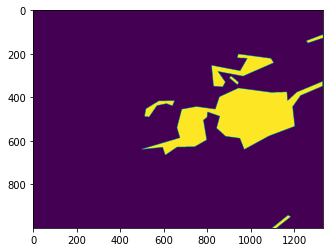

In [43]:
plt.imshow(mask[:, :, 2])

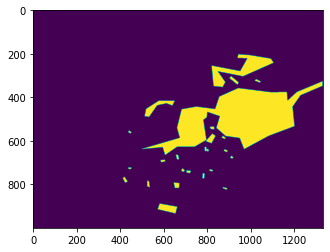

In [42]:
plt.imshow(mask[:, :, 4])

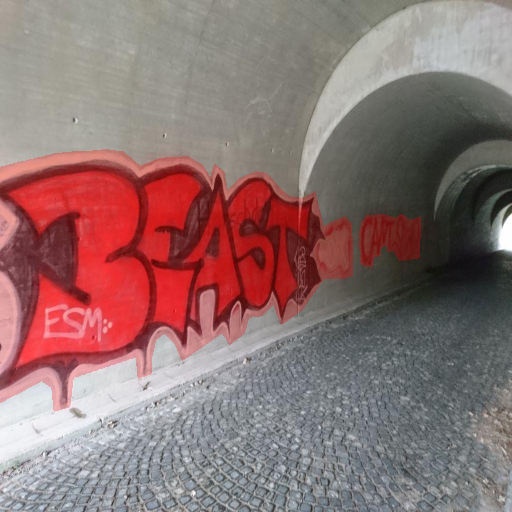

In [61]:
from PIL import Image

def visualize_overlap(rgb_image, mask):
    rgb_image = Image.fromarray(rgb_image)
    mask = Image.fromarray(mask)

    # Ensure the mask is in 'L' mode (grayscale)
    mask = mask.convert('L')

    # Convert the binary mask to an RGBA image where the mask defines the alpha channel
    rgba_mask = Image.new('RGBA', mask.size, (255, 0, 0, 0))  # Red color for overlap, initially transparent
    for x in range(mask.width):
        for y in range(mask.height):
            if mask.getpixel((x, y)) > 0:  # Assuming non-zero values in the mask indicate regions of interest
                rgba_mask.putpixel((x, y), (255, 0, 0, 64))  # Set the pixel to red with full opacity

    # Composite the RGB image and the RGBA mask
    overlapped_image = Image.alpha_composite(rgb_image.convert('RGBA'), rgba_mask)

    # Display the result
    return overlapped_image

# Example usage

img = np.load('/mnt/md0/dacl10k/images/validation/dacl10k_v2_validation_0001.npy')
msk = np.load('/mnt/md0/dacl10k/annotations/validation/dacl10k_v2_validation_0001.npy')

visualize_overlap(img, msk[:, :, 7])

In [29]:
for folder in glob('/mnt/md0/dacl10k/images/*')[1:]:
    files = glob(folder+'/*.npy')
    for file in tqdm(files):
        save = '/'.join(file.split('/')[-3:]).replace('.npy', '.jpg').replace('/train/', '/training/')
        save_msk = save.replace('images/', 'annotations/').replace('.jpg', '.png')
        #if os.path.exists(f"/mnt/md0/dacl10k/AAA_MMSEG/data/{save}"): continue
        
        image = np.load(file)
        mask = np.load(file.replace('/images/', '/annotations/'))
        
        mask = np.argmax(np.concatenate([np.zeros((mask.shape[0], mask.shape[1], 1)), mask], -1), -1)
        bg = (mask==0)*20
        mask = mask + bg
        mask = np.stack([mask]*1, -1)
        
        cv2.imwrite(f"/mnt/md0/dacl10k/AAA_MMSEG/data2/{save}", image)
        cv2.imwrite(f"/mnt/md0/dacl10k/AAA_MMSEG/data2/{save_msk}", mask)
        #np.save(, mask)
        
        #break
    #break

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6935/6935 [02:04<00:00, 55.59it/s]


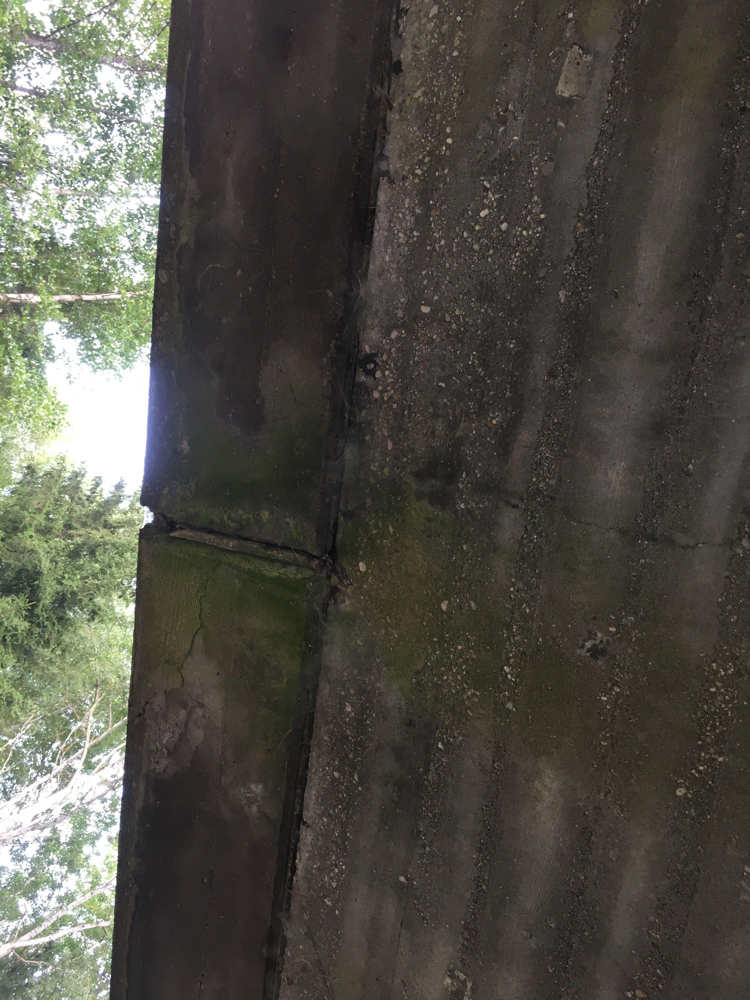

In [6]:
Image.open(file.replace('.npy', '.jpg'))

In [8]:
for folder in glob('/mnt/md0/dacl10k/images/*')[1:]:
    files = glob(folder+'/*.npy')
    for file in tqdm(files):
        save = '/'.join(file.split('/')[-3:]).replace('.npy', '.jpg').replace('/train/', '/training/')
        save_msk = save.replace('images/', 'annotations/').replace('.jpg', '.png')
        #if os.path.exists(f"/mnt/md0/dacl10k/AAA_MMSEG/data/{save}"): continue
        
        image = cv2.imread(file.replace('.npy', '.jpg'))[:, :, ::-1]
        image = cv2.resize(image, (640, 640))
        
        mask = np.load(file.replace('/images/', '/annotations/'))
        
        mask = cv2.resize(mask, (640, 640))
        
        mask = np.argmax(np.concatenate([np.zeros((mask.shape[0], mask.shape[1], 1)), mask], -1), -1)
        bg = (mask==0)*20
        mask = mask + bg
        mask = np.stack([mask]*1, -1)
        
        cv2.imwrite(f"/mnt/md0/dacl10k/AAA_MMSEG/data3/{save}", image)
        cv2.imwrite(f"/mnt/md0/dacl10k/AAA_MMSEG/data3/{save_msk}", mask)
        #np.save(, mask)
        
        #break
    #break

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6935/6935 [09:50<00:00, 11.74it/s]


In [80]:
for folder in glob('/mnt/md0/dacl10k/images/*')[1:]:
    files = glob(folder+'/*.npy')
    for file in tqdm(files):
        save = '/'.join(file.split('/')[-3:]).replace('.npy', '.jpg').replace('/train/', '/training/')
        save_msk = save.replace('images/', 'annotations/').replace('.jpg', '.png')
        
        save = f"/mnt/md0/dacl10k/AAA_MMSEG/data/{save}"
        save_msk = f"/mnt/md0/dacl10k/AAA_MMSEG/data/{save_msk}"
        
        im = Image.open(save)
        msk = Image.open(save_msk)
        if im.size != (512, 512):
            print('problem')
        if msk.size != (512, 512):
            print('problem 2')
        
        #break

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6935/6935 [00:00<00:00, 6995.84it/s]
